In [2]:
#hide
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 727kB 5.1MB/s 
     |████████████████████████████████| 358kB 28.2MB/s 
     |████████████████████████████████| 61kB 8.3MB/s 
     |████████████████████████████████| 1.0MB 30.0MB/s 
     |████████████████████████████████| 51kB 7.9MB/s 
     |████████████████████████████████| 40kB 6.5MB/s 
     |████████████████████████████████| 92kB 10.0MB/s 
     |████████████████████████████████| 40kB 6.7MB/s 
     |████████████████████████████████| 51kB 8.3MB/s 
     |████████████████████████████████| 61kB 9.6MB/s 
     |████████████████████████████████| 2.6MB 43.8MB/s 
Mounted at /content/gdrive


In [3]:
#hide
from fastbook import *
from fastai.vision.widgets import *

In [4]:
key = 'a9ad0e66051d41748aa11bd49a1fc703'#os.environ.get('AZURE_SEARCH_KEY', 'XXX')

In [5]:
import os
os.chdir('gdrive/My Drive/course-v4-master')

In [6]:
results = search_images_bing(key, 'dandelion flower')
ims = results.attrgot('content_url')
len(ims)

150

In [7]:
ims[0]

'https://upload.wikimedia.org/wikipedia/commons/4/4f/DandelionFlower.jpg'

In [10]:
dest = 'images/dandelion.jpg'
download_url(ims[0], dest)

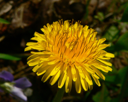

In [11]:
im = Image.open(dest)
im.to_thumb(128,128)

In [33]:
flower_types = 'peony','tulip','dandelion'
path = Path('flowers')

In [36]:
if not path.exists():
    path.mkdir()
    for o in flower_types:
        print(o)
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o} flower')
        download_images(dest, urls=results.attrgot('content_url'))

In [38]:
fns = get_image_files(path)
fns

(#445) [Path('flowers/tulip/00000001.jpg'),Path('flowers/tulip/00000005.jpg'),Path('flowers/tulip/00000002.jpg'),Path('flowers/tulip/00000008.jpg'),Path('flowers/tulip/00000011.jpg'),Path('flowers/tulip/00000003.jpg'),Path('flowers/tulip/00000009.jpg'),Path('flowers/tulip/00000010.jpg'),Path('flowers/tulip/00000013.jpg'),Path('flowers/tulip/00000007.jpg')...]

In [39]:
failed = verify_images(fns)
failed

(#0) []

In [40]:
failed.map(Path.unlink);

In [41]:
flowers = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

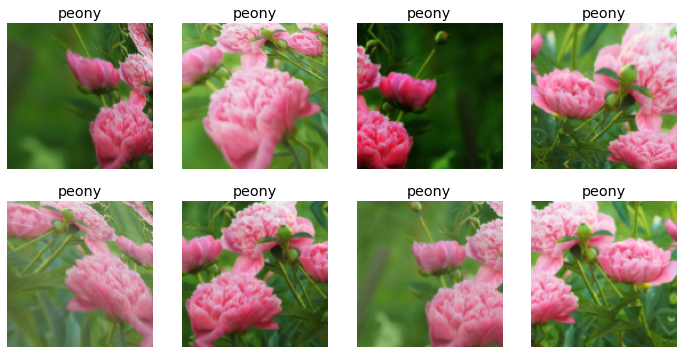

In [42]:
flowers = flowers.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = flowers.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [43]:
!ls flowers

dandelion  peony  tulip


In [44]:
flowers = flowers.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = flowers.dataloaders(path)

In [45]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.262685,0.234941,0.078652,00:18


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


epoch,train_loss,valid_loss,error_rate,time
0,0.255848,0.123263,0.056180,00:19
1,0.167826,0.064298,0.033708,00:18
2,0.127792,0.047859,0.022472,00:19
3,0.103553,0.046166,0.022472,00:20


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


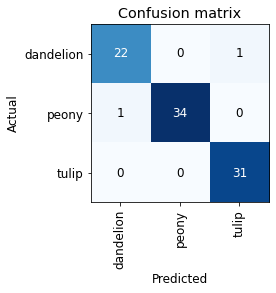

In [46]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

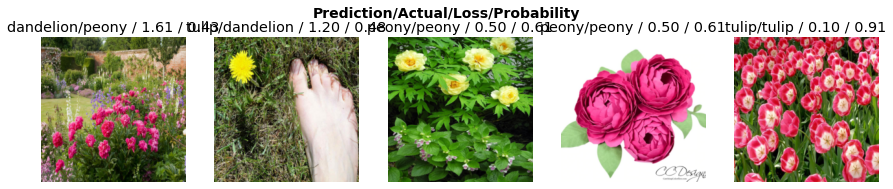

In [47]:
interp.plot_top_losses(5, nrows=1)

In [48]:
#hide_output
cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [49]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)


In [53]:
!pwd

/content/gdrive/My Drive/course-v4-master


In [51]:
learn.export()

In [55]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [56]:
learn_inf = load_learner(path/'export.pkl')

In [57]:
learn_inf.predict('images/dandelion.jpg')

('dandelion', tensor(0), tensor([9.9970e-01, 2.6027e-04, 3.8046e-05]))

In [58]:
learn_inf.dls.vocab

(#3) ['dandelion','peony','tulip']